# YOLOv8

## 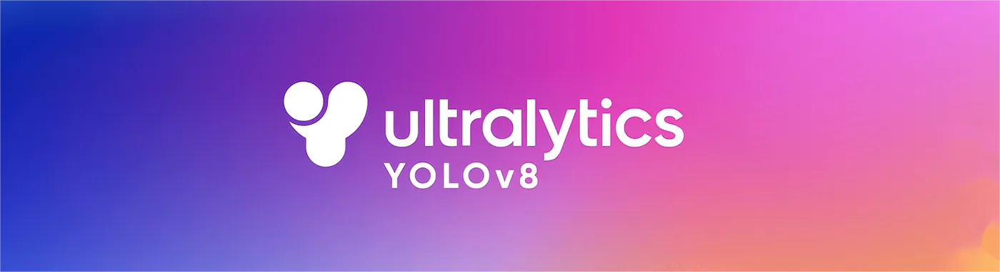
Ultralytics YOLOv8 is the latest version of the YOLO (You Only Look Once) object detection and image segmentation model developed by Ultralytics. The YOLOv8 model is designed to be fast, accurate, and easy to use, making it an excellent choice for a wide range of object detection and image segmentation tasks. It can be trained on large datasets and is capable of running on a variety of hardware platforms, from CPUs to GPUs.
## 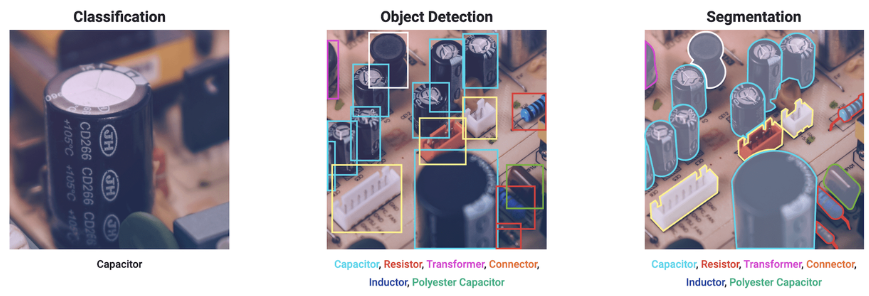

# How to Train YOLOv8 Object Detection and Instance Segmentation  on a Custom Dataset

## Steps in this Tutorial
In this tutorial, we are going to cover:

* Before you start
* Install YOLOv8
* Inference with Pre-trained COCO Model
* Roboflow Universe
* Preparing a custom dataset
* Custom Training
* Validate Custom Model
* Inference with Custom Model

Let's begin!



## Before you start
Pro Tip: Use GPU Acceleration

Let's make sure that we have access to GPU.

In [1]:
!nvidia-smi 

Sat May 25 14:50:33 2024       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 517.20       Driver Version: 517.20       CUDA Version: 11.7     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ... WDDM  | 00000000:01:00.0 Off |                  N/A |
| N/A   65C    P3    14W /  N/A |      0MiB /  4096MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Let's create a small helper variable called home that will allow us for easier management of paths to data set and other images.

In [2]:
import os
HOME = os.getcwd() 
print(HOME)

C:\Users\User\Desktop\yolov8


## Install YOLOv8

In [3]:
# Pip install method (recommended)

!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196  Python-3.8.18 torch-2.3.0+cu118 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
Setup complete  (16 CPUs, 23.7 GB RAM, 317.2/453.4 GB disk)


In [5]:
import torch#确认gpu是否可用

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
print()

#Additional Info when using cuda
if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))
    print('Memory Usage:')
    print('Allocated:', round(torch.cuda.memory_allocated(0)/1024**3,1), 'GB')
    print('Cached:   ', round(torch.cuda.memory_reserved(0)/1024**3,1), 'GB')

Using device: cuda

NVIDIA GeForce RTX 3050 Ti Laptop GPU
Memory Usage:
Allocated: 0.0 GB
Cached:    0.0 GB


In [6]:
from ultralytics import YOLO
from IPython.display import display, Image

## Roboflow Universe
Need data for your project? Before spending time on annotating, check out Roboflow Universe, a repository of more than 110,000 open-source datasets that you can use in your projects. 
## https://universe.roboflow.com/
## 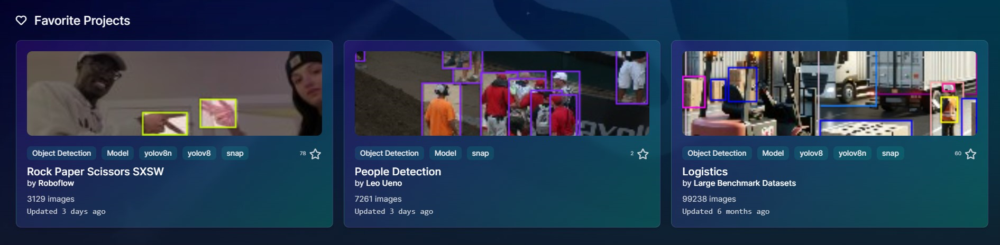

## Preparing a custom dataset
Building a custom dataset can be a painful process. It might take dozens or even hundreds of hours to collect images, label them, and export them in the proper format. Fortunately, Roboflow makes this process as straightforward and fast as possible. Let me show you how!
## https://roboflow.com/

* Step 1: Creating project

Before you start, you need to create a Roboflow account. Once you do that, you can create a new project in the Roboflow dashboard. Keep in mind to choose the right project type. In our case, Object Detection.
## 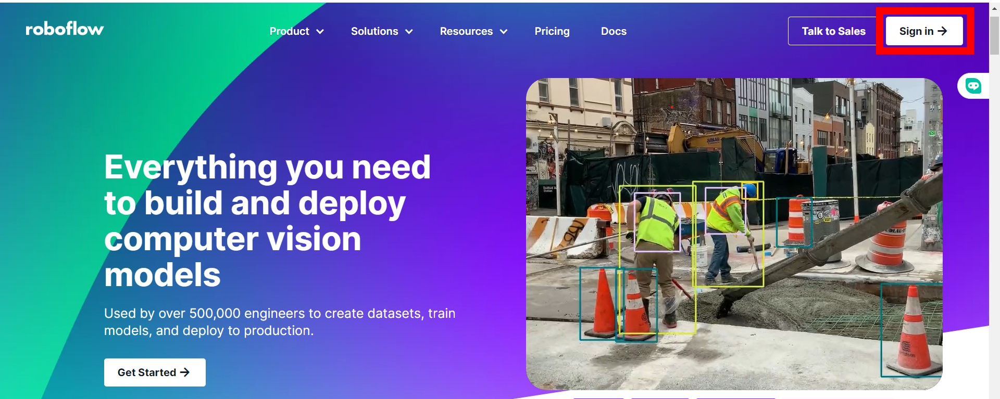

## 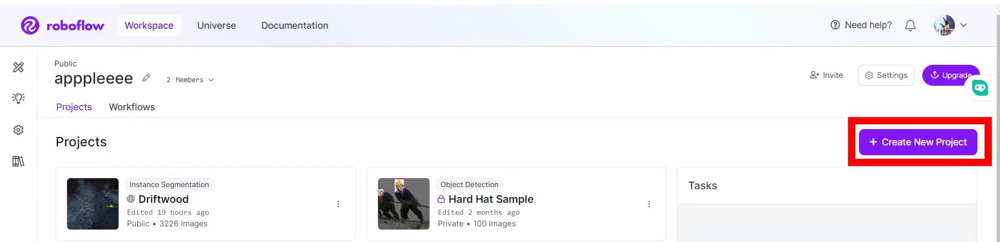

## 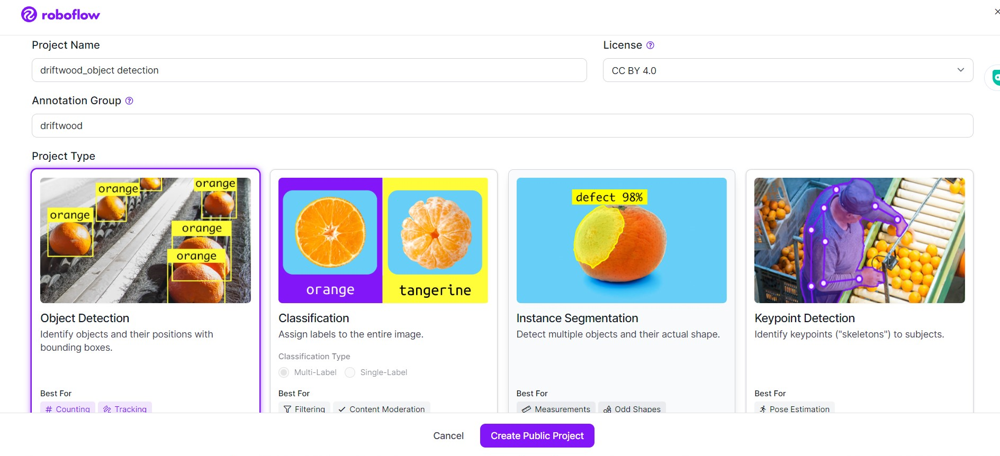

## Step 2: Uploading images
Next, add the data to your newly created project. 
## 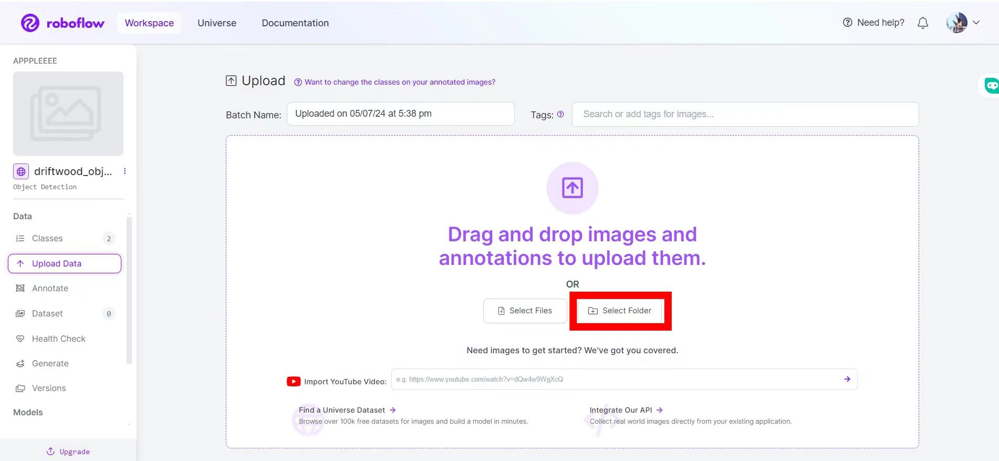

## 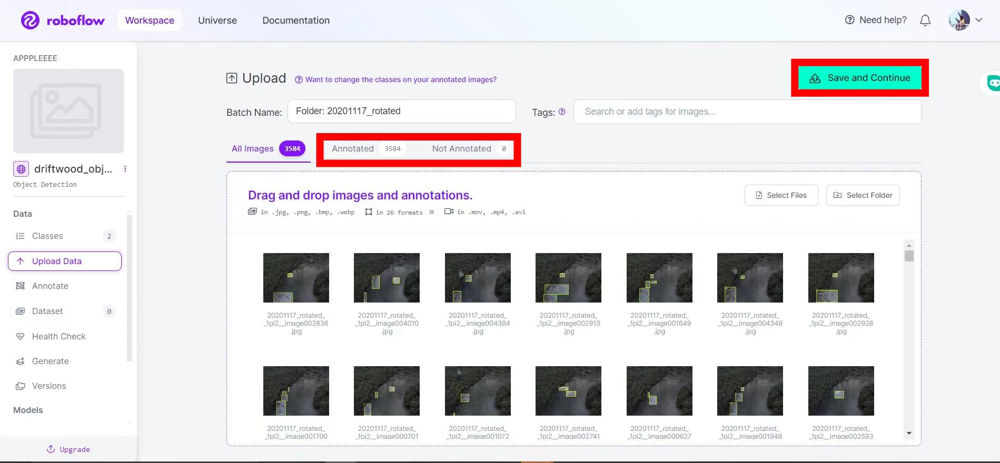

## Step 3: Labeling
If you only have images, you can label them in Roboflow Annotate.
## 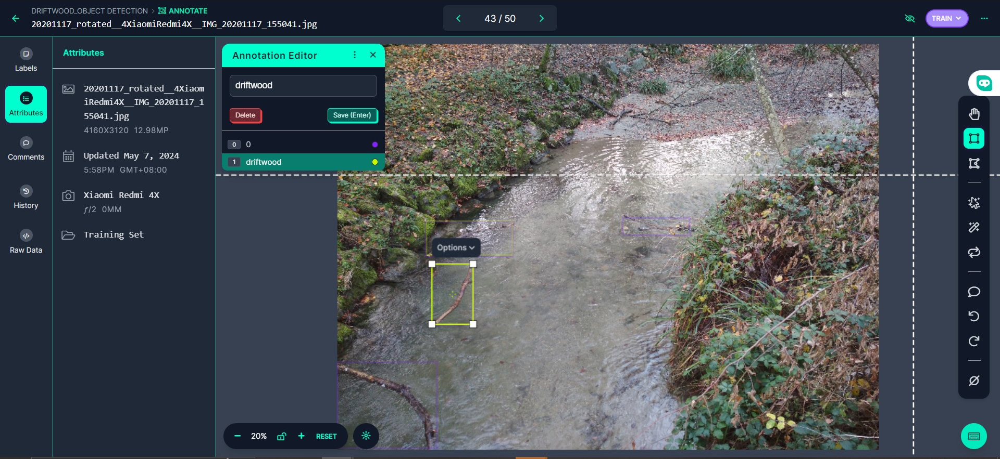

## Step 4: Generate new dataset version
Now that we have our images and annotations added, we can Generate a Dataset Version. When Generating a Version, you may elect to add preprocessing and augmentations. This step is completely optional, however, it can allow you to significantly improve the robustness of your model.
## 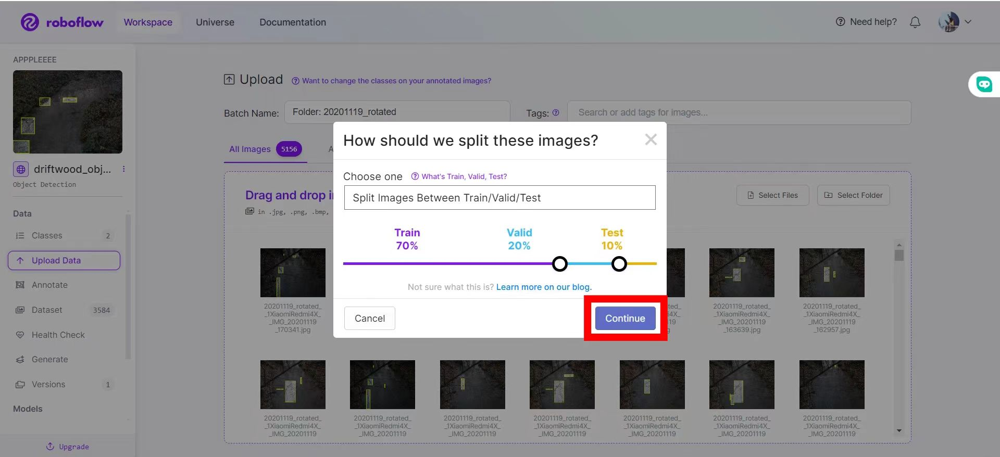

## 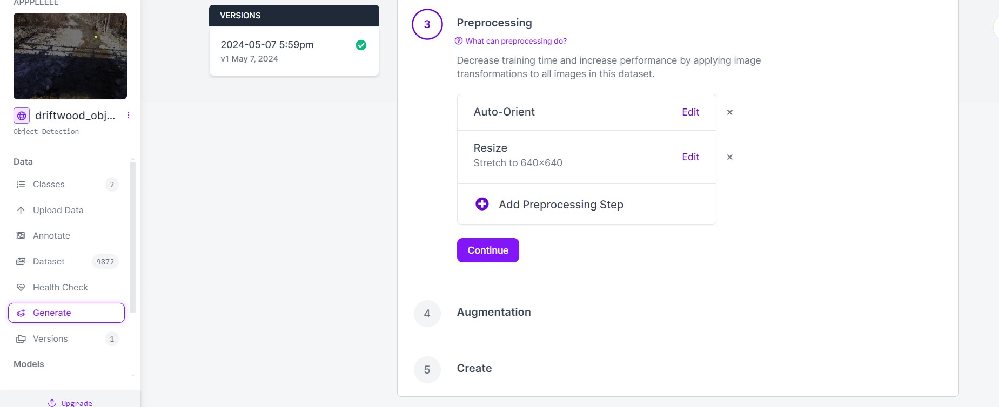

## 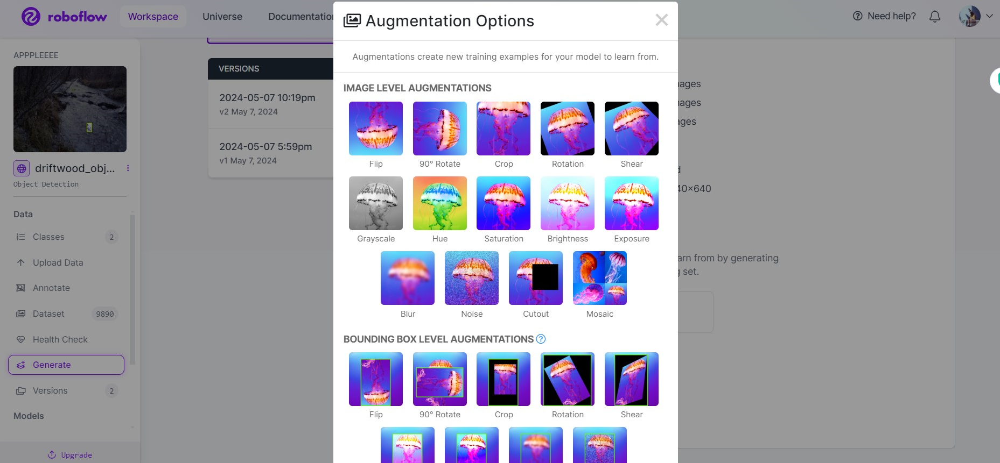

## Step 5: Exporting dataset
Once the dataset version is generated, we have a hosted dataset we can load directly into our notebook for easy training. Click Export and select the YOLO v8 dataset format.

## 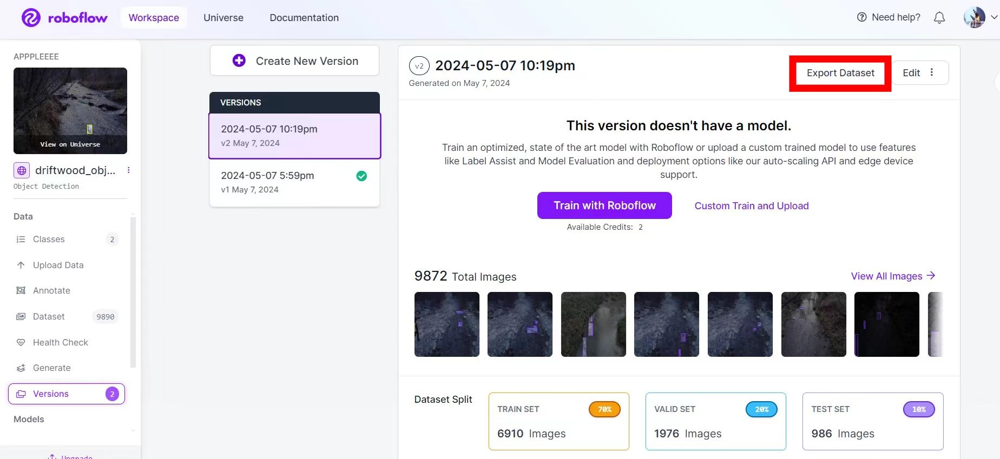

## 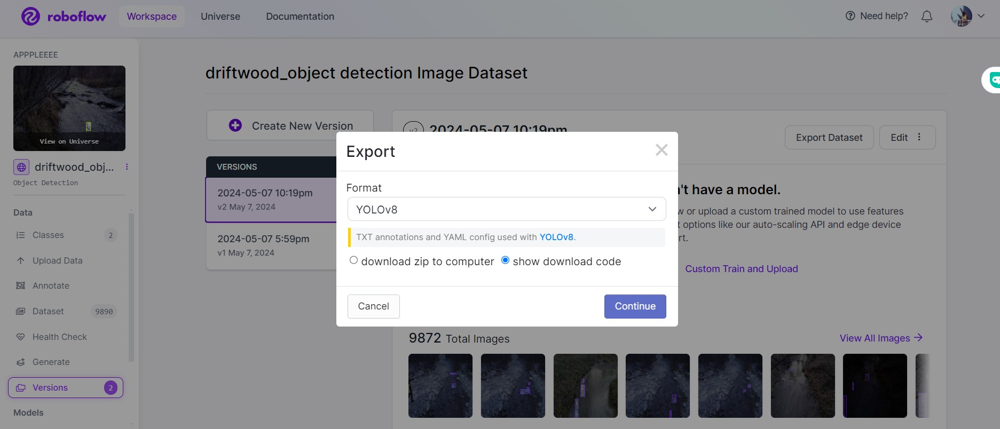

## 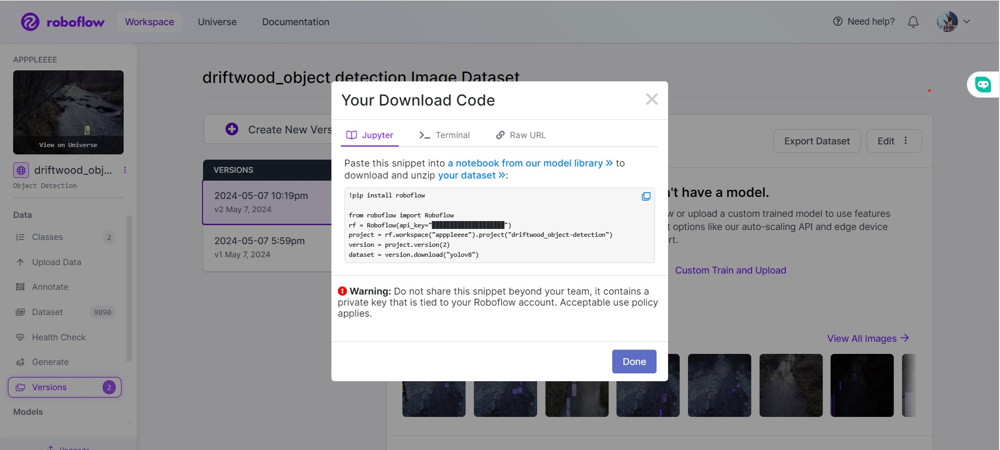

In [7]:
print(HOME)

C:\Users\User\Desktop\yolov8


In [8]:
import os
dataset_path = r"C:\Users\User\Desktop\yolov8\datasets" # change your path
if not os.path.exists(dataset_path):
    os.makedirs(dataset_path)
os.chdir(dataset_path)

In [9]:
!pip install roboflow --quiet --user

In [10]:
from roboflow import Roboflow
rf = Roboflow(api_key="xpm98tX1Jk9tPYq8RID7")
project = rf.workspace("project-fzduw").project("tennis-ox8d5")
version = project.version(1)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to tennis-1 in yolov8:: 100%|███████████████████████| 112/112 [00:00<00:00, 2809.40it/s]


In [11]:
# 獲取當前工作目錄
current_directory = os.getcwd()
print("當前目錄:", current_directory)

# 列出當前目錄中的所有文件和文件夾
contents = os.listdir(current_directory)
print("目錄內容:")
for item in contents:
    print(item)

當前目錄: C:\Users\User\Desktop\yolov8\datasets
目錄內容:
tennis-1


In [12]:
%cd C:\Users\User\Desktop\yolov8\datasets\tennis-1

C:\Users\User\Desktop\yolov8\datasets\tennis-1


## Custom Training

In [27]:
torch.cuda.empty_cache()

In [28]:
%%time

dataset_path = r"C:\Users\User\Desktop\yolov8\datasets\tennis-1\data.yaml"
!yolo task=detect mode=train model=yolov8s.pt data={dataset_path} epochs=25 imgsz=640 plots=True 

CPU times: total: 46.9 ms
Wall time: 1min 5s


New https://pypi.org/project/ultralytics/8.2.21 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196  Python-3.8.18 torch-2.3.0+cu118 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
engine\trainer: task=detect, mode=train, model=yolov8s.pt, data=C:\Users\User\Desktop\yolov8\datasets\tennis-1\data.yaml, epochs=25, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=Fals

In [29]:
!dir C:\Users\User\Desktop\yolov8\datasets\tennis-1\runs\detect\train3

 驱动器 C 中的卷是 OS
 卷的序列号是 F6ED-66C2

 C:\Users\User\Desktop\yolov8\datasets\tennis-1\runs\detect\train3 的目录

2024/05/25  15:18    <DIR>          .
2024/05/25  15:18    <DIR>          ..
2024/05/25  15:17             1,534 args.yaml
2024/05/25  15:18            74,593 confusion_matrix.png
2024/05/25  15:18            85,999 confusion_matrix_normalized.png
2024/05/25  15:18           108,252 F1_curve.png
2024/05/25  15:17            90,286 labels.jpg
2024/05/25  15:17           162,136 labels_correlogram.jpg
2024/05/25  15:18            75,688 PR_curve.png
2024/05/25  15:18            99,567 P_curve.png
2024/05/25  15:18             8,762 results.csv
2024/05/25  15:18           329,093 results.png
2024/05/25  15:18            90,733 R_curve.png
2024/05/25  15:17           528,788 train_batch0.jpg
2024/05/25  15:17           499,802 train_batch1.jpg
2024/05/25  15:17           112,802 train_batch2.jpg
2024/05/25  15:18           479,112 train_batch45.jpg
2024/05/25  15:18           456,030 t

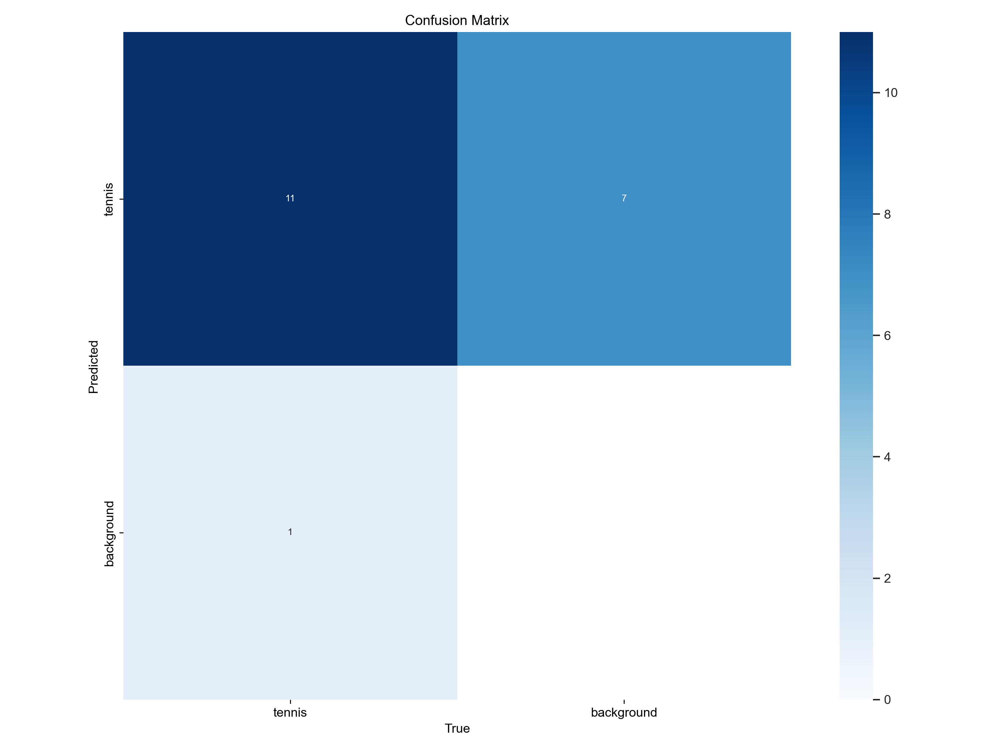

In [30]:
Image(filename=r'C:\Users\User\Desktop\yolov8\datasets\tennis-1\runs\detect\train3/confusion_matrix.png', width=600)

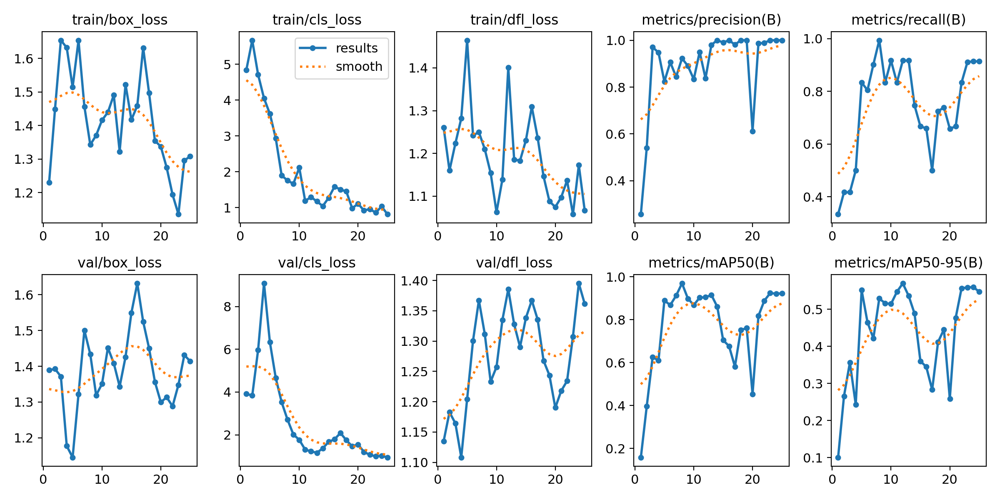

In [31]:
Image(filename=r'C:\Users\User\Desktop\yolov8\datasets\tennis-1\runs\detect\train3/results.png', width=600)

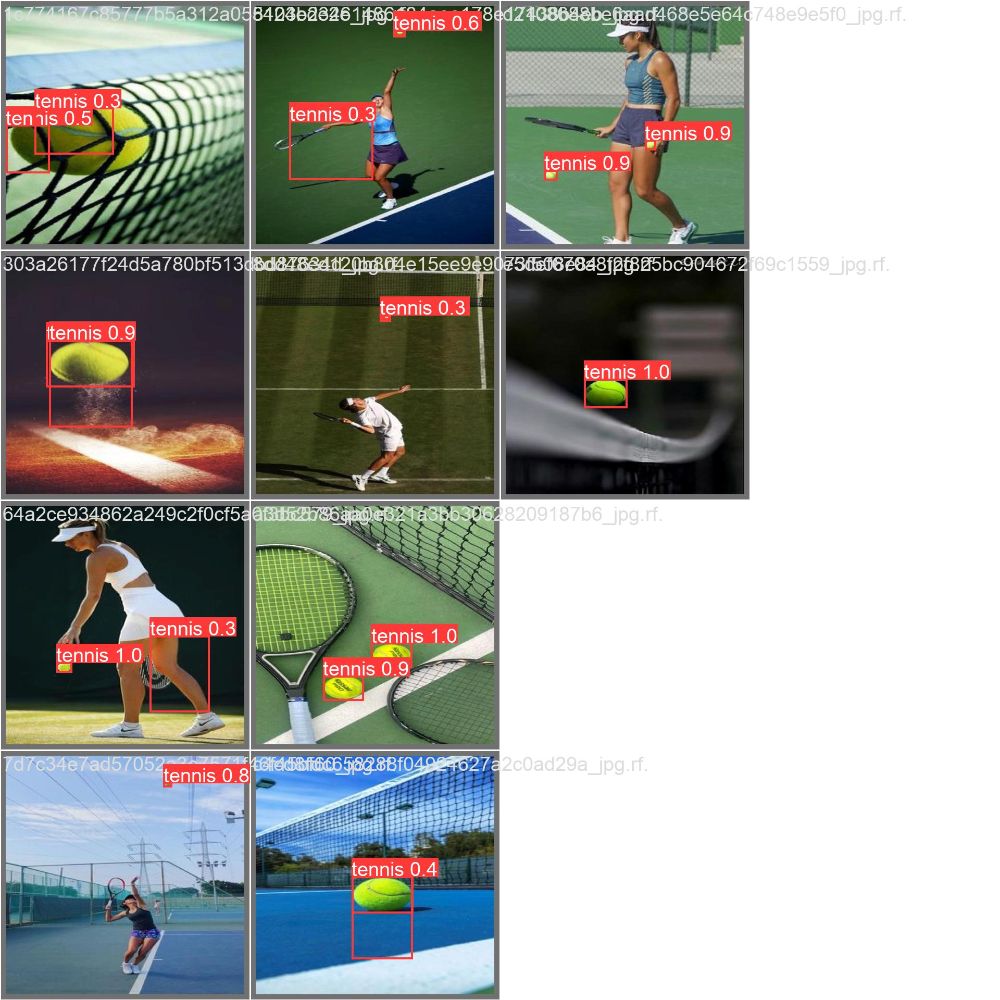

In [32]:
Image(filename=r'C:\Users\User\Desktop\yolov8\datasets\tennis-1\runs\detect\train3/val_batch0_pred.jpg', width=600)

## Validate Custom Model

In [33]:
!yolo task=detect mode=val model=C:\Users\User\Desktop\yolov8\datasets\tennis-1\runs\detect\train3/weights/best.pt data={dataset.location}/data.yaml

Ultralytics YOLOv8.0.196  Python-3.8.18 torch-2.3.0+cu118 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs

val: Scanning C:\Users\User\Desktop\yolov8\datasets\tennis-1\valid\labels.cache... 10 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10/10 [00:00<?, ?it/s]
val: Scanning C:\Users\User\Desktop\yolov8\datasets\tennis-1\valid\labels.cache... 10 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10/10 [00:00<?, ?it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]C:\Users\User\miniconda3\envs\yolov8\lib\site-packages\torch\nn\modules\conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native

## Inference with Custom Model

In [34]:
!yolo task=detect mode=predict model=C:\Users\User\Desktop\yolov8\datasets\tennis-1\runs\detect\train3/weights/best.pt conf=0.4 source={dataset.location}/test/images save=True

Ultralytics YOLOv8.0.196  Python-3.8.18 torch-2.3.0+cu118 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs

image 1/5 C:\Users\User\Desktop\yolov8\datasets\tennis-1\test\images\482179f98d47f9b820c30bcc2d57335c_jpg.rf.0cde90a4c02cb3bdd545357e7cc38d82.jpg: 640x640 (no detections), 13.5ms
image 2/5 C:\Users\User\Desktop\yolov8\datasets\tennis-1\test\images\a8d1ebaf0a14de8027ccf72c5b8c9eb6_jpg.rf.08debb85605ec0d0cfa1a0101dfb2e3f.jpg: 640x640 1 tennis, 14.0ms
image 3/5 C:\Users\User\Desktop\yolov8\datasets\tennis-1\test\images\b503d238c47bb7fc9f5e20436c67c4f2_jpg.rf.7743e31cc1a4e2de5a1199cb09d4ee9e.jpg: 640x640 2 tenniss, 14.0ms
image 4/5 C:\Users\User\Desktop\yolov8\datasets\tennis-1\test\images\c1db737cc91d247c79ee4935a48a57b3_jpg.rf.8adc8860dac19dee1adf01a92a9bf1cc.jpg: 640x640 2 tenniss, 13.1ms
image 5/5 C:\Users\User\Desktop\yolov8\datasets\tennis-1\test\images\c398afd5a538412f143dfc587e96576e_jpg.r

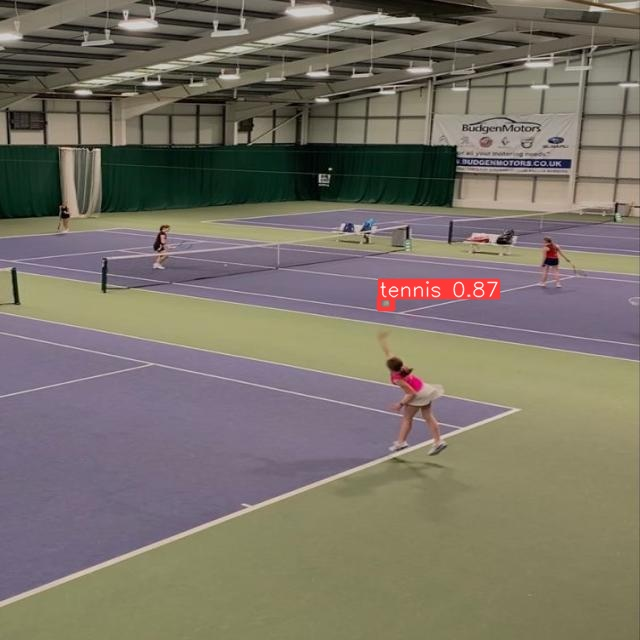

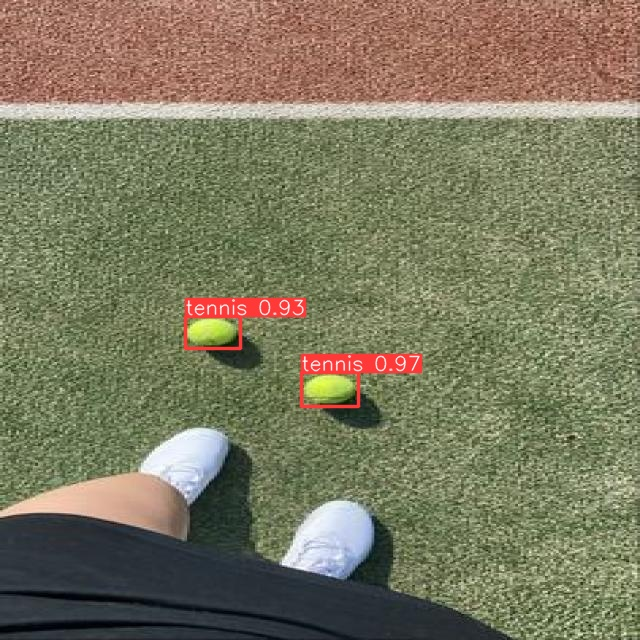

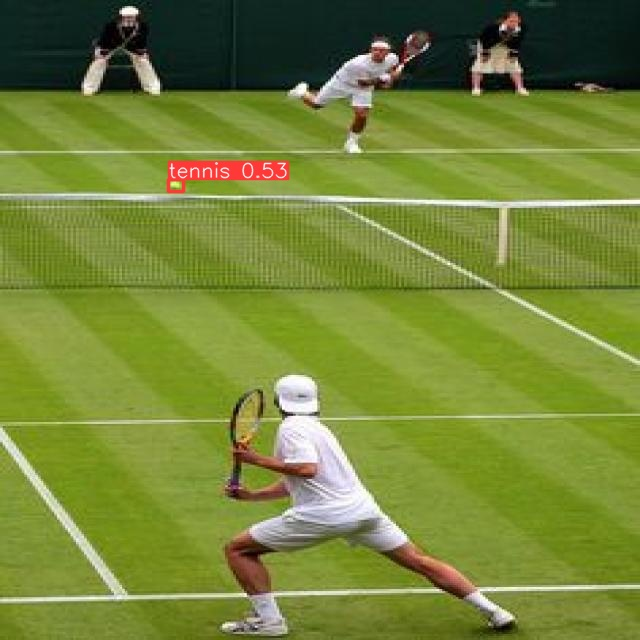

In [35]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(r'C:\Users\User\Desktop\yolov8\datasets\tennis-1/runs/detect/predict4/*.jpg')[2:5]:
      display(Image(filename=image_path, width=600))
      print("\n")

In [36]:
!yolo task=detect mode=predict model=C:\Users\User\Desktop\yolov8\datasets\tennis-1\runs\detect\train3/weights/best.pt conf=0.4 source=C:\Users\User\Desktop\yolov8\datasets\tennis-1\videos\738313751.853294.mp4 save=True

Ultralytics YOLOv8.0.196  Python-3.8.18 torch-2.3.0+cu118 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs

video 1/1 (1/1031) C:\Users\User\Desktop\yolov8\datasets\tennis-1\videos\738313751.853294.mp4: 640x384 3 tenniss, 92.2ms
video 1/1 (2/1031) C:\Users\User\Desktop\yolov8\datasets\tennis-1\videos\738313751.853294.mp4: 640x384 3 tenniss, 9.0ms
video 1/1 (3/1031) C:\Users\User\Desktop\yolov8\datasets\tennis-1\videos\738313751.853294.mp4: 640x384 3 tenniss, 9.0ms
video 1/1 (4/1031) C:\Users\User\Desktop\yolov8\datasets\tennis-1\videos\738313751.853294.mp4: 640x384 3 tenniss, 8.0ms
video 1/1 (5/1031) C:\Users\User\Desktop\yolov8\datasets\tennis-1\videos\738313751.853294.mp4: 640x384 3 tenniss, 8.0ms
video 1/1 (6/1031) C:\Users\User\Desktop\yolov8\datasets\tennis-1\videos\738313751.853294.mp4: 640x384 2 tenniss, 9.0ms
video 1/1 (7/1031) C:\Users\User\Desktop\yolov8\datasets\tennis-1\videos\738313751.